### Student Information
Name:蘇文傑

Student ID:107065469

GitHub ID:Chancing0

---

### Instructions

- First, you should attempt the **take home** exercises provided in the [notebook](https://github.com/omarsar/data_mining_lab/blob/master/news_data_mining.ipynb) we used for the first lab session. Attempt all the exercises, as it is counts towards the final grade of your first assignment (20%). 

- Then, download the dataset provided in this [link](https://archive.ics.uci.edu/ml/datasets/Sentiment+Labelled+Sentences#). The sentiment dataset contains a `sentence` and `score` label. Read the specificiations of the dataset before you start exploring it. 


- Then, you are asked to apply each of the data exploration and data operation steps learned in the [first lab session](https://github.com/omarsar/data_mining_lab) on **the new dataset**. You don't need to explain all the procedures as we did in the notebook, but you are expected to provide some **minimal comments** explaining your code. You are also expected to use the same libraries used in the first lab session. You are allowed to use and modify the `helper` functions we provided in the first lab session or create your own. Also, be aware that the helper functions may need modification as you are dealing with a completely different dataset. This part is worth 30% of your grade!

- In addition to applying the same operations from the first lab, we are asking that you attempt the following tasks on the new sentiment dataset as well (40%):
    - Use your creativity and imagination to generate **new data visualizations**. Refer to online resources and the Data Mining textbook for inspiration and ideas. 
    - Generate **TF-IDF features** from the tokens of each text. Refer to this Sciki-learn [guide](http://scikit-learn.org/stable/modules/generated/sklearn.feature_extraction.text.TfidfVectorizer.html) on how you may go about doing this. Keep in mind that you are generating a matrix similar to the term-document matrix we implemented in our first lab session. However, the weights will be computed differently and should represent the TF-IDF value of each word per document as opposed to the word frequency.
    - Using both the TF-IDF and word frequency features, try to compute the **similarity** between random sentences and report results. Read the "distance simiilarity" section of the Data Mining textbook on what measures you can use here. [Cosine similarity](https://jamesmccaffrey.wordpress.com/2017/03/29/the-cosine-similarity-of-two-sentences/) is one of these methods but there are others. Try to explore a few of them in this exercise and report the differences in result. 
    - Lastly, implement a simple **Naive Bayes classifier** that automatically classifies the records into their categories. Try to implement this using scikit-learn built in classifiers and use both the TF-IDF features and word frequency features to build two seperate classifiers. Refer to this [nice article](https://hub.packtpub.com/implementing-3-naive-bayes-classifiers-in-scikit-learn/) on how to build this type of classifier using scikit-learn. Report the classification accuracy of both your models. If you are struggling with this step please reach us on Slack as soon as possible.   


- Presentation matters! You are also expected to **tidy up your notebook** and attempt new data operations and techniques that you have learned so far in the Data Mining course. Surprise us! This segment is worth 10% of your grade. The idea of this exercise is to begin thinking of how you will program the concepts you have learned and the process that is involved. 


- After completing all the above tasks, you are free to remove this header block and **submit** your assignment following the guide provided in the [README.md](https://github.com/omarsar/dm_2018_hw_1/blob/master/README.md) file of the assignment's repository. 

In [2]:
### Begin Assignment Here!

In [84]:
%load_ext autoreload
%autoreload 2

In [16]:
import sklearn
import numpy
import pandas as pd
from sklearn import datasets

# Text file loading

In [68]:
amazon_data = pd.read_csv('sentiment labelled sentences/amazon_cells_labelled.txt',sep="\t", header=None)

In [69]:
type(amazon_data)

pandas.core.frame.DataFrame

In [72]:
amazon_data.columns  = ["content","class"]

In [73]:
amazon_data[:10]

,content,class
0,So there is no way for me to plug it in here i...,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more...,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up...,0
6,If you have several dozen or several hundred c...,0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


In [80]:

imdb_data = pd.read_csv('sentiment labelled sentences/imdb_labelled.txt',sep="\t", header=None)
imdb_data.columns  = ["content","class"]
yelp_data = pd.read_csv('sentiment labelled sentences/yelp_labelled.txt',sep="\t", header=None)
yelp_data.columns  = ["content","class"]

In [81]:
imdb_data[:10]

,content,class
0,"A very, very, very slow-moving, aimless movie ...",0
1,Not sure who was more lost - the flat characte...,0
2,Attempting artiness with black & white and cle...,0
3,Very little music or anything to speak of.,0
4,The best scene in the movie was when Gerardo i...,1
5,"The rest of the movie lacks art, charm, meanin...",0
6,Wasted two hours.,0
7,Saw the movie today and thought it was a good ...,1
8,A bit predictable.,0
9,Loved the casting of Jimmy Buffet as the scien...,1


In [83]:
yelp_data[:10]

,content,class
0,Wow... Loved this place.,1
1,Crust is not good.,0
2,Not tasty and the texture was just nasty.,0
3,Stopped by during the late May bank holiday of...,1
4,The selection on the menu was great and so wer...,1
5,Now I am getting angry and I want my damn pho.,0
6,Honeslty it didn't taste THAT fresh.),0
7,The potatoes were like rubber and you could te...,0
8,The fries were great too.,1
9,A great touch.,1


# concateta 3 dataset 

In [87]:
original_dataset = pd.concat([amazon_data,imdb_data,yelp_data])
print(amazon_data.shape)
print(imdb_data.shape)
print(yelp_data.shape)
print(original_dataset.shape)

(1000, 2)
(748, 2)
(1000, 2)


In [86]:
original_dataset.shape

(2748, 2)

# something wrong with loading imdb_data , I spent 3h to solve it

In [88]:
imdb_data

,content,class
0,"A very, very, very slow-moving, aimless movie ...",0
1,Not sure who was more lost - the flat characte...,0
2,Attempting artiness with black & white and cle...,0
3,Very little music or anything to speak of.,0
4,The best scene in the movie was when Gerardo i...,1
5,"The rest of the movie lacks art, charm, meanin...",0
6,Wasted two hours.,0
7,Saw the movie today and thought it was a good ...,1
8,A bit predictable.,0
9,Loved the casting of Jimmy Buffet as the scien...,1


# solve by this way

In [208]:
# Fix by this ways to make dataset loading right!!!!
cc =open( 'sentiment labelled sentences/imdb_labelled.txt',encoding='utf8')
x = []
for line in cc.readlines():
    y = [value for value in line.split('\t')]
    x.append( y )

cc.close()
imdb_data = pd.DataFrame(x)
imdb_data.columns  = ["content","class"]
imdb_data["class"] = (imdb_data["class"]=='1\n')*1
imdb_data

,content,class
0,"A very, very, very slow-moving, aimless movie ...",0
1,Not sure who was more lost - the flat characte...,0
2,Attempting artiness with black & white and cle...,0
3,Very little music or anything to speak of.,0
4,The best scene in the movie was when Gerardo i...,1
5,"The rest of the movie lacks art, charm, meanin...",0
6,Wasted two hours.,0
7,Saw the movie today and thought it was a good ...,1
8,A bit predictable.,0
9,Loved the casting of Jimmy Buffet as the scien...,1


In [216]:
original_dataset = pd.concat([amazon_data,imdb_data,yelp_data],ignore_index=True)
print(amazon_data.shape)
print(imdb_data.shape)
print(yelp_data.shape)
print(original_dataset.shape)

(1000, 2)
(1000, 2)
(1000, 2)
(3000, 2)


In [217]:
original_dataset

,content,class
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up right to get decent volume.,0
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


In [220]:
#select subset for class 1  
original_dataset[original_dataset['class']==1]

,content,class
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
4,The mic is great.,1
7,If you are Razr owner...you must have this!,1
10,And the sound quality is great.,1
11,He was very impressed when going from the original battery to the extended battery.,1
13,Very good quality though,1
15,Highly recommend for any one who has a blue tooth phone.,1
17,So Far So Good!.,1
18,Works great!.,1


In [222]:
original_dataset[original_dataset['class']==1].shape

(1500, 2)

# Check for missing value!!!!!

In [241]:
# Check for missing value!!!!!
import helpers.data_mining_helpers as dmh
original_dataset.isnull().apply(lambda x: dmh.check_missing_values(original_dataset))

content    (The amoung of missing records is: , 0)
class      (The amoung of missing records is: , 0)
dtype: object

In [239]:
# Check for missing value!!!!!
print(sum(original_dataset['content'].isnull()))
print(sum(original_dataset['class'].isnull()))

0
0


# checking and Dealing with Duplicate Data

In [228]:
# checking and Dealing with Duplicate Data
original_dataset[original_dataset.duplicated('content',keep = False)==True]

,content,class
18,Works great!.,1
179,"If you like a loud buzzing to override all your conversations, then this phone is for you!",0
180,Don't buy this product.,0
187,Great phone!.,1
262,Works great.,1
285,Great phone!.,1
290,Great Phone.,1
392,This is a great deal.,1
402,Excellent product for the price.,1
407,Works great.,1


# Drop duplicates datas and only keep once

In [229]:
clean_original_dataset = original_dataset.drop_duplicates(keep=False, inplace=False)

In [230]:
clean_original_dataset

,content,class
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up right to get decent volume.,0
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


# Reset index for clean_original_dataset

In [232]:
clean_original_dataset.reset_index(drop=True)

,content,class
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0
1,"Good case, Excellent value.",1
2,Great for the jawbone.,1
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0
4,The mic is great.,1
5,I have to jiggle the plug to get it to line up right to get decent volume.,0
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0
7,If you are Razr owner...you must have this!,1
8,"Needless to say, I wasted my money.",0
9,What a waste of money and time!.,0


# Creat category_name column

In [322]:
category_name = { 0:'negative',1:'positive'}
category_name

{0: 'negative', 1: 'positive'}

In [323]:
clean_original_dataset['category_name'] = clean_original_dataset['class'].map(category_name)

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [324]:
clean_original_dataset[:10]

,content,class,category_name,unigrams
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0,negative,"[So, there, is, no, way, for, me, to, plug, it, in, here, in, the, US, unless, I, go, by, a, converter, .]"
1,"Good case, Excellent value.",1,positive,"[Good, case, ,, Excellent, value, .]"
2,Great for the jawbone.,1,positive,"[Great, for, the, jawbone, .]"
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0,negative,"[Tied, to, charger, for, conversations, lasting, more, than, 45, minutes.MAJOR, PROBLEMS, !, !]"
4,The mic is great.,1,positive,"[The, mic, is, great, .]"
5,I have to jiggle the plug to get it to line up right to get decent volume.,0,negative,"[I, have, to, jiggle, the, plug, to, get, it, to, line, up, right, to, get, decent, volume, .]"
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0,negative,"[If, you, have, several, dozen, or, several, hundred, contacts, ,, then, imagine, the, fun, of, sending, each, of, them, one, by, one, .]"
7,If you are Razr owner...you must have this!,1,positive,"[If, you, are, Razr, owner, ..., you, must, have, this, !]"
8,"Needless to say, I wasted my money.",0,negative,"[Needless, to, say, ,, I, wasted, my, money, .]"
9,What a waste of money and time!.,0,negative,"[What, a, waste, of, money, and, time, !, .]"


In [282]:
clean_original_dataset[clean_original_dataset['class']==1].shape

(1480, 3)

In [283]:
clean_original_dataset[clean_original_dataset['class']==0].shape

(1486, 3)

# Sampling

In [284]:
X_sample = clean_original_dataset.sample(n=1500)

In [285]:
X_sample[:10]

,content,class,category_name
2518,"Anyway, I do not think i will go back there.",0,negative
408,Plantronics Bluetooth Excelent Buy.,1,positive
127,it did not work in my cell phone plug i am very up set with the charger!.,0,negative
720,"Good value, works fine - power via USB, car, or wall outlet.",1,positive
2323,"A couple of months later, I returned and had an amazing meal.",1,positive
2702,Have been going since 2007 and every meal has been awesome!!,1,positive
812,Battery charge-life is quite long.,1,positive
1643,The cast is always entertaining as usual.,1,positive
2458,Best tater tots in the southwest.,1,positive
2130,This place is way too overpriced for mediocre food.,0,negative


In [243]:
category_name

{0: 'negative ', 1: 'positive '}

In [248]:
categories = ['negative ','positive ']
categories

['negative ', 'positive ']

In [288]:
clean_original_dataset['category_name'].value_counts()

negative     1486
positive     1480
Name: category_name, dtype: int64

In [286]:
X_sample['category_name'].value_counts()

negative     760
positive     740
Name: category_name, dtype: int64

In [256]:
import matplotlib.pyplot as plt
%matplotlib inline

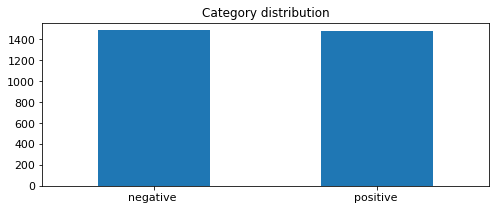

In [289]:
clean_original_dataset['category_name'].value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    #ylim = [0, 650],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

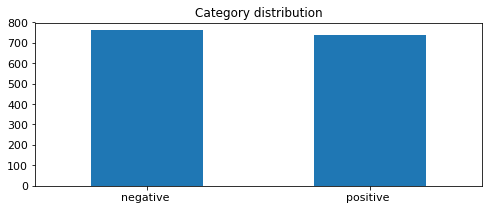

In [287]:
X_sample['category_name'].value_counts().plot(kind = 'bar',
                                    title = 'Category distribution',
                                    #ylim = [0, 650],        
                                    rot = 0, fontsize = 11, figsize = (8,3))

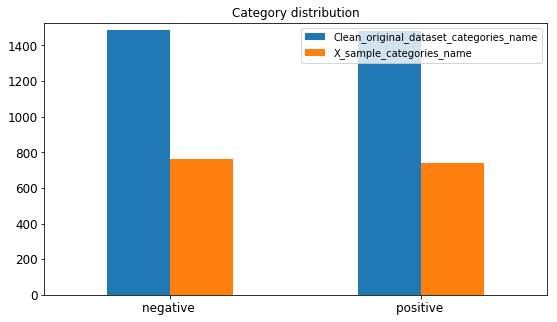

In [293]:
uppone_bondary = max(clean_original_dataset['category_name'].value_counts()) +40
df = pd.DataFrame({'X_sample_categories_name': X_sample['category_name'].value_counts(),
                  'Clean_original_dataset_categories_name': clean_original_dataset['category_name'].value_counts()})
df.plot.bar(title = 'Category distribution',ylim = [0, uppone_bondary],rot=0,fontsize = 12, figsize = (9,5))

# Token generate

In [294]:
import nltk

In [296]:
clean_original_dataset['unigrams'] = clean_original_dataset['content'].apply(lambda x: dmh.tokenize_text(x))

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


In [325]:
clean_original_dataset[:20]

,content,class,category_name,unigrams
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0,negative,"[So, there, is, no, way, for, me, to, plug, it, in, here, in, the, US, unless, I, go, by, a, converter, .]"
1,"Good case, Excellent value.",1,positive,"[Good, case, ,, Excellent, value, .]"
2,Great for the jawbone.,1,positive,"[Great, for, the, jawbone, .]"
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0,negative,"[Tied, to, charger, for, conversations, lasting, more, than, 45, minutes.MAJOR, PROBLEMS, !, !]"
4,The mic is great.,1,positive,"[The, mic, is, great, .]"
5,I have to jiggle the plug to get it to line up right to get decent volume.,0,negative,"[I, have, to, jiggle, the, plug, to, get, it, to, line, up, right, to, get, decent, volume, .]"
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0,negative,"[If, you, have, several, dozen, or, several, hundred, contacts, ,, then, imagine, the, fun, of, sending, each, of, them, one, by, one, .]"
7,If you are Razr owner...you must have this!,1,positive,"[If, you, are, Razr, owner, ..., you, must, have, this, !]"
8,"Needless to say, I wasted my money.",0,negative,"[Needless, to, say, ,, I, wasted, my, money, .]"
9,What a waste of money and time!.,0,negative,"[What, a, waste, of, money, and, time, !, .]"


In [298]:
from sklearn.feature_extraction.text import CountVectorizer

count_vect = CountVectorizer()
clean_original_dataset_counts = count_vect.fit_transform(clean_original_dataset.content)

In [299]:
clean_original_dataset_counts

<2966x5154 sparse matrix of type '<class 'numpy.int64'>'
	with 31452 stored elements in Compressed Sparse Row format>

In [300]:
clean_original_dataset_counts[0]

<1x5154 sparse matrix of type '<class 'numpy.int64'>'
	with 18 stored elements in Compressed Sparse Row format>

In [495]:
clean_original_dataset_counts[0].toarray().shape

(1, 5154)

## show the count_vectorize relationship with token index

In [301]:
vector_to_word = pd.DataFrame.from_dict(count_vect.get_feature_names())
vector_to_word.index.name='Vectors'
vector_to_word.columns = ['Words']
vector_to_word[(clean_original_dataset_counts[0].toarray()>=1).T]

,Words
Vectors,
646,by
1013,converter
1829,for
1982,go
2158,here
2314,in
2427,is
2432,it
2809,me


In [303]:
vector_to_word

,Words
Vectors,
0,00
1,10
2,100
3,11
4,12
5,13
6,15
7,15g
8,15pm


In [497]:
count_vect.transform(['100 11 10']).toarray()

(1, 5154)

In [305]:
plot_x = ["term_"+str(i) for i in count_vect.get_feature_names()[0:20]]
plot_y = ["doc_"+ str(i) for i in list(clean_original_dataset.index)[0:20]]
plot_z = clean_original_dataset_counts[0:20, 0:20].toarray()

reduce_df_todraw = pd.DataFrame(clean_original_dataset_counts.toarray(), columns = ["term_"+str(i) for i in count_vect.get_feature_names()], index = ["doc_"+ str(i) for i in list(clean_original_dataset.index)])
type(reduce_df_todraw)
reduce_df_todraw[:10][:10]

term_00  term_10  term_100  term_11  term_12  term_13  term_15  \
doc_0        0        0         0        0        0        0        0   
doc_1        0        0         0        0        0        0        0   
doc_2        0        0         0        0        0        0        0   
doc_3        0        0         0        0        0        0        0   
doc_4        0        0         0        0        0        0        0   
doc_5        0        0         0        0        0        0        0   
doc_6        0        0         0        0        0        0        0   
doc_7        0        0         0        0        0        0        0   
doc_8        0        0         0        0        0        0        0   
doc_9        0        0         0        0        0        0        0   

       term_15g  term_15pm  term_17  term_18  term_18th  term_1928  term_1947  \
doc_0         0          0        0        0          0          0          0   
doc_1         0          0        0        0          0          0          0   
doc_2         0          0        0        0          0          0          0   
doc_3         0          0        0        0          0          0          0   
doc_4         0          0        0        0          0          0          0   
doc_5         0          0        0        0          0          0          0   
doc_6         0          0        0        0          0          0          0   
doc_7         0          0        0        0          0          0          0   
doc_8         0          0        0        0          0          0          0   
doc_9         0          0        0        0          0          0          0   

       term_1948  term_1949  term_1971  term_1973  term_1979  term_1980  \
doc_0          0          0          0          0          0          0   
doc_1          0          0          0          0          0          0   
doc_2          0          0          0          0          0          0   
doc_3          0          0          0          0          0          0   
doc_4          0          0          0          0          0          0   
doc_5          0          0          0          0          0          0   
doc_6          0          0          0          0          0          0   
doc_7          0          0          0          0          0          0   
doc_8          0          0          0          0          0          0   
doc_9          0          0          0          0          0          0   

       term_1986  term_1995  term_1998  term_20  term_2000  term_2005  \
doc_0          0          0          0        0          0          0   
doc_1          0          0          0        0          0          0   
doc_2          0          0          0        0          0          0   
doc_3          0          0          0        0          0          0   
doc_4          0          0          0        0          0          0   
doc_5          0          0          0        0          0          0   
doc_6          0          0          0        0          0          0   
doc_7          0          0          0        0          0          0   
doc_8          0          0          0        0          0          0   
doc_9          0          0          0        0          0          0   

       term_2006  term_2007  term_20th  term_2160  term_23  term_24  term_25  \
doc_0          0          0          0          0        0        0        0   
doc_1          0          0          0          0        0        0        0   
doc_2          0          0          0          0        0        0        0   
doc_3          0          0          0          0        0        0        0   
doc_4          0          0          0          0        0        0        0   
doc_5          0          0          0          0        0        0        0   
doc_6          0          0          0          0        0        0        0   
doc_7          0          0          0   

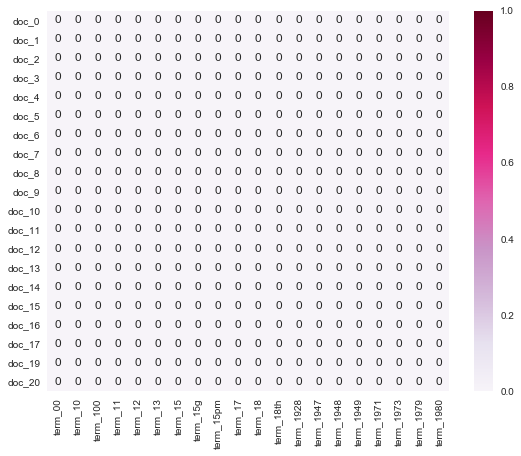

In [306]:
import seaborn as sns

df_todraw = pd.DataFrame(plot_z, columns = plot_x, index = plot_y)
plt.subplots(figsize=(9, 7))
ax = sns.heatmap(df_todraw,
                 cmap="PuRd",
                 vmin=0, vmax=1, annot=True)

### it's hard to see whole word frequence table,may not be a good visualization ways

In [307]:
from sklearn.decomposition import PCA

In [311]:
clean_original_dataset_counts.shape

(2966, 5154)

(2966, 3)
['negative', 'positive']


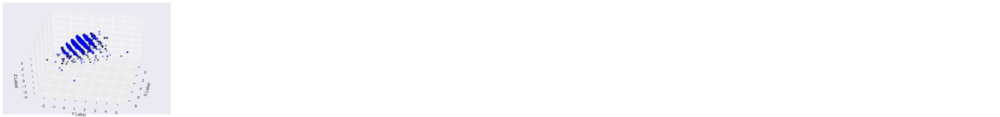

In [330]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

X_reduced = PCA(n_components = 3).fit_transform(clean_original_dataset_counts.toarray())  #numpy.ndarray
print(X_reduced.shape)
categories = ['negative','positive']
print(categories)
col = ['black', 'blue']
# plot

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for c, category in zip(col, categories):
    xs = X_reduced[clean_original_dataset['category_name'] == category].T[0]
    ys = X_reduced[clean_original_dataset['category_name'] == category].T[1]
    zs = X_reduced[clean_original_dataset['category_name'] == category].T[2]
    ax.scatter(xs, ys, zs,c = c, marker='o')

ax.grid(color='gray', linestyle=':', linewidth=2, alpha=0.2)
ax.set_xlabel('\nX Label')
ax.set_ylabel('\nY Label')
ax.set_zlabel('\nZ Label')

ax.view_init(45, 10)   #tune the angle (0-360,0-360)
plt.show()

### PCA = 3 and it's also hard to find an angle to separate them into two category

In [328]:
#Answer here is the camera position plot by plotly 
#As 3D object shows it's hard to find any angle to nice separate four categories
import plotly
import plotly.plotly as py
import plotly.graph_objs as go

X_reduced = PCA(n_components = 3).fit_transform(clean_original_dataset_counts.toarray())  #numpy.ndarray
print(X_reduced.shape)
categories = ['negative','positive']
print(categories)

#initial xs,ys,zs for next assignment!!!!!!!!!!spend 4h to fix it !!!!!!
xs = list(range(4))
ys = list(range(4))
zs = list(range(4))
def plot_word_frequency(word_list, plot_title):
    clr=['rgba(0, 0, 255)', 'rgba(255, 0, 0)']
    for i,category in zip( range(0,2), categories):
        xs[i] = word_list[clean_original_dataset['category_name'] == category].T[0]
        ys[i] = word_list[clean_original_dataset['category_name'] == category].T[1]
        zs[i] = word_list[clean_original_dataset['category_name'] == category].T[2]

    trace1  = go.Scatter3d(
        name='negative',
        x = xs[0],
        y = ys[0],
        z = zs[0],
        mode='markers',
        marker=dict(
            size=2,
            line=dict(
                color=clr[0],
                width=0.01
            )
            ,opacity=1
        )
    )
    trace2  = go.Scatter3d(
        name='positive',
        x = xs[1],
        y = ys[1],
        z = zs[1],
        mode='markers',
        marker=dict(
            size=2,
            line=dict(
                color=clr[1],
                width=0.01
            )
            ,opacity=1
        )
    )       
    data = [trace1 ,trace2 ]
    layout = go.Layout(
        title = plot_title,
        scene = dict(
            xaxis = dict(
                title='X AXIS TITLE'),
            yaxis = dict(
                title='Y AXIS TITLE'),
            zaxis = dict(
                title='Z AXIS TITLE')),
        width=700,
        margin=dict(
            l=0,
            r=0,
            b=0,
            t=0
        )
    )

    fig = go.Figure(data = data, layout=layout)
    return fig
plotly.tools.set_credentials_file(username='Chancing', api_key='OX0eKMEzCjEXUgsgL7BB')
py.iplot(plot_word_frequency(X_reduced , "PCA n=3"))

(2966, 3)
['negative', 'positive']


### PCA = 3  and it's also hard to find an angle to separate them into two category

In [331]:
term_frequencies = []
for j in range(0,clean_original_dataset_counts.shape[1]):
    term_frequencies.append(sum(clean_original_dataset_counts[:,j].toarray()))

In [334]:
import numpy as np
term_frequencies = np.asarray(clean_original_dataset_counts.sum(axis=0))[0]

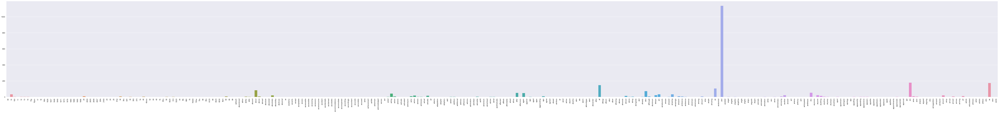

In [335]:
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=count_vect.get_feature_names()[:300], 
            y=term_frequencies[:300])
g.set_xticklabels(count_vect.get_feature_names()[:300], rotation = 90);

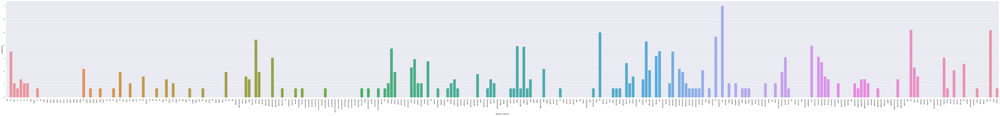

In [340]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]
log_source_df = pd.DataFrame({'feature_names' : count_vect.get_feature_names(),'fre' : term_frequencies_log })

plt.subplots(figsize=(100, 10))
g = sns.barplot(x=log_source_df["feature_names"][:300],
                y=log_source_df["fre"][:300])
g.set_xticklabels(log_source_df["feature_names"][:300], rotation = 90);

# softing

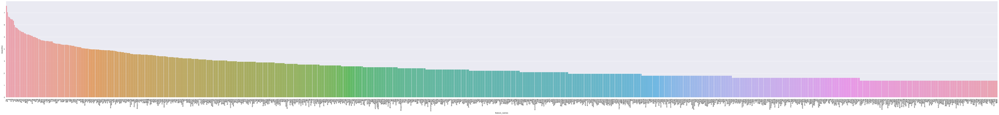

In [343]:
import math
term_frequencies_log = [math.log(i) for i in term_frequencies]
log_source_df = pd.DataFrame({'feature_names' : count_vect.get_feature_names(),'fre' : term_frequencies_log })
log_sord_df = log_source_df.sort_values(by='fre',ascending=False)
plt.subplots(figsize=(100, 10))
g = sns.barplot(x=log_sord_df["feature_names"][:1000],
                y=log_sord_df["fre"][:1000])
g.set_xticklabels(log_sord_df["feature_names"][:1000], rotation = 90);

# one-hot encoding by class

In [344]:
from sklearn import preprocessing, metrics, decomposition, pipeline, dummy

In [345]:
mlb = preprocessing.LabelBinarizer()

In [347]:
mlb.fit(clean_original_dataset['class'])

LabelBinarizer(neg_label=0, pos_label=1, sparse_output=False)

In [348]:
mlb.classes_

array([0, 1], dtype=int64)

In [349]:
clean_original_dataset['bin_category'] = mlb.transform(clean_original_dataset['class']).tolist()

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [350]:
clean_original_dataset[:10]

,content,class,category_name,unigrams,bin_category
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0,negative,"[So, there, is, no, way, for, me, to, plug, it, in, here, in, the, US, unless, I, go, by, a, converter, .]",[0]
1,"Good case, Excellent value.",1,positive,"[Good, case, ,, Excellent, value, .]",[1]
2,Great for the jawbone.,1,positive,"[Great, for, the, jawbone, .]",[1]
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0,negative,"[Tied, to, charger, for, conversations, lasting, more, than, 45, minutes.MAJOR, PROBLEMS, !, !]",[0]
4,The mic is great.,1,positive,"[The, mic, is, great, .]",[1]
5,I have to jiggle the plug to get it to line up right to get decent volume.,0,negative,"[I, have, to, jiggle, the, plug, to, get, it, to, line, up, right, to, get, decent, volume, .]",[0]
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0,negative,"[If, you, have, several, dozen, or, several, hundred, contacts, ,, then, imagine, the, fun, of, sending, each, of, them, one, by, one, .]",[0]
7,If you are Razr owner...you must have this!,1,positive,"[If, you, are, Razr, owner, ..., you, must, have, this, !]",[1]
8,"Needless to say, I wasted my money.",0,negative,"[Needless, to, say, ,, I, wasted, my, money, .]",[0]
9,What a waste of money and time!.,0,negative,"[What, a, waste, of, money, and, time, !, .]",[0]


# one-hot encoding by category_name

In [351]:
mlb.fit(clean_original_dataset['category_name'])
mlb.classes_
clean_original_dataset['bin_category_name'] = mlb.transform(clean_original_dataset['category_name']).tolist()
clean_original_dataset[0:9]

D:\Anaconda\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,content,class,category_name,unigrams,bin_category,bin_category_name
0,So there is no way for me to plug it in here in the US unless I go by a converter.,0,negative,"[So, there, is, no, way, for, me, to, plug, it, in, here, in, the, US, unless, I, go, by, a, converter, .]",[0],[0]
1,"Good case, Excellent value.",1,positive,"[Good, case, ,, Excellent, value, .]",[1],[1]
2,Great for the jawbone.,1,positive,"[Great, for, the, jawbone, .]",[1],[1]
3,Tied to charger for conversations lasting more than 45 minutes.MAJOR PROBLEMS!!,0,negative,"[Tied, to, charger, for, conversations, lasting, more, than, 45, minutes.MAJOR, PROBLEMS, !, !]",[0],[0]
4,The mic is great.,1,positive,"[The, mic, is, great, .]",[1],[1]
5,I have to jiggle the plug to get it to line up right to get decent volume.,0,negative,"[I, have, to, jiggle, the, plug, to, get, it, to, line, up, right, to, get, decent, volume, .]",[0],[0]
6,"If you have several dozen or several hundred contacts, then imagine the fun of sending each of them one by one.",0,negative,"[If, you, have, several, dozen, or, several, hundred, contacts, ,, then, imagine, the, fun, of, sending, each, of, them, one, by, one, .]",[0],[0]
7,If you are Razr owner...you must have this!,1,positive,"[If, you, are, Razr, owner, ..., you, must, have, this, !]",[1],[1]
8,"Needless to say, I wasted my money.",0,negative,"[Needless, to, say, ,, I, wasted, my, money, .]",[0],[0]


# TfidfVectorizer

In [424]:
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(clean_original_dataset['content'])
print(vectorizer.get_feature_names())
print(X.shape)

['00', '10', '100', '11', '12', '13', '15', '15g', '15pm', '17', '18', '18th', '1928', '1947', '1948', '1949', '1971', '1973', '1979', '1980', '1986', '1995', '1998', '20', '2000', '2005', '2006', '2007', '20th', '2160', '23', '24', '25', '2mp', '30', '30s', '325', '35', '350', '375', '3o', '40', '40min', '42', '44', '45', '4s', '4ths', '50', '5020', '510', '5320', '54', '5lb', '680', '70', '70000', '700w', '70s', '80', '80s', '8125', '85', '8525', '8530', '8pm', '90', '95', '99', 'aailiyah', 'abandoned', 'abhor', 'ability', 'able', 'abound', 'about', 'above', 'abroad', 'absolute', 'absolutel', 'absolutely', 'absolutley', 'abstruse', 'abysmal', 'ac', 'academy', 'accents', 'accept', 'acceptable', 'access', 'accessable', 'accessible', 'accessing', 'accessory', 'accessoryone', 'accident', 'accidentally', 'acclaimed', 'accolades', 'accommodations', 'accomodate', 'accompanied', 'according', 'accordingly', 'accountant', 'accurate', 'accurately', 'accused', 'ache', 'achievement', 'achille', '

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [425]:
# X[0] is the first sentence index
X[0].toarray()[0][2000:2200]

array([0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.     

In [426]:
test1 = ['00 10 100 11 12 13 00','00 10 100 11 12 13 ','00 10 100 11 12 13 ']
aa = vectorizer.transform(test1)
aa[0].toarray()[0]

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



array([0.71448261, 0.24217289, 0.32741523, ..., 0.        , 0.        ,
       0.        ])

In [427]:
aa[2].toarray()[0]

array([0.45474847, 0.30827272, 0.41678152, ..., 0.        , 0.        ,
       0.        ])

In [428]:
aa

<3x5154 sparse matrix of type '<class 'numpy.float64'>'
	with 18 stored elements in Compressed Sparse Row format>

# sampling

In [457]:
sample_2 = clean_original_dataset.sample(n = 4)
sample_vectorlize = vectorizer.transform(sample_2['content'])
sample_vectorlize[0]
sample_2

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



,content,class,category_name,unigrams,bin_category,bin_category_name
208,Good transmit audio.,1,positive,"[Good, transmit, audio, .]",[1],[1]
151,"Audio Quality is poor, very poor.",0,negative,"[Audio, Quality, is, poor, ,, very, poor, .]",[0],[0]
1745,"Despite the pans of reviewers, I liked this movie.",1,positive,"[Despite, the, pans, of, reviewers, ,, I, liked, this, movie, .]",[1],[1]
8,"Needless to say, I wasted my money.",0,negative,"[Needless, to, say, ,, I, wasted, my, money, .]",[0],[0]


In [448]:
sample_vectorlize[1]

<1x5154 sparse matrix of type '<class 'numpy.float64'>'
	with 1 stored elements in Compressed Sparse Row format>

# Similarity

In [463]:
# the result show how many word both appear between sentences 
cosine_similarity(sample_vectorlize[0],sample_vectorlize[1:4])

array([[0.27635811, 0.        , 0.        ]])

In [464]:
cosine_similarity(sample_vectorlize,sample_vectorlize)

array([[1.        , 0.27635811, 0.        , 0.        ],
       [0.27635811, 1.        , 0.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        ]])

In [465]:
from sklearn.metrics.pairwise import euclidean_distances

In [466]:
euclidean_distances(sample_vectorlize,sample_vectorlize)

array([[0.        , 1.20303108, 1.41421356, 1.41421356],
       [1.20303108, 0.        , 1.41421356, 1.41421356],
       [1.41421356, 1.41421356, 0.        , 1.41421356],
       [1.41421356, 1.41421356, 1.41421356, 0.        ]])

In [467]:
from sklearn.metrics.pairwise import manhattan_distances

In [468]:
manhattan_distances(sample_vectorlize,sample_vectorlize)

array([[0.        , 2.70049741, 4.19212554, 3.98364987],
       [2.70049741, 0.        , 4.50826278, 4.29978711],
       [4.19212554, 4.50826278, 0.        , 4.87115538],
       [3.98364987, 4.29978711, 4.87115538, 0.        ]])

In [473]:
from sklearn.metrics.pairwise import *

In [474]:
linear_kernel(sample_vectorlize,sample_vectorlize)

array([[1.        , 0.27635811, 0.        , 0.        ],
       [0.27635811, 1.        , 0.        , 0.        ],
       [0.        , 0.        , 1.        , 0.        ],
       [0.        , 0.        , 0.        , 1.        ]])

In [476]:
polynomial_kernel(sample_vectorlize,sample_vectorlize,degree=2 )

array([[1.00038809, 1.00010724, 1.        , 1.        ],
       [1.00010724, 1.00038809, 1.        , 1.        ],
       [1.        , 1.        , 1.00038809, 1.        ],
       [1.        , 1.        , 1.        , 1.00038809]])

In [478]:
polynomial_kernel(sample_vectorlize,sample_vectorlize,degree=3 )

array([[1.00058219, 1.00016087, 1.        , 1.        ],
       [1.00016087, 1.00058219, 1.        , 1.        ],
       [1.        , 1.        , 1.00058219, 1.        ],
       [1.        , 1.        , 1.        , 1.00058219]])

In [479]:
sigmoid_kernel(sample_vectorlize,sample_vectorlize)

array([[0.76167563, 0.76161667, 0.76159416, 0.76159416],
       [0.76161667, 0.76167563, 0.76159416, 0.76159416],
       [0.76159416, 0.76159416, 0.76167563, 0.76159416],
       [0.76159416, 0.76159416, 0.76159416, 0.76167563]])

In [480]:
rbf_kernel(sample_vectorlize,sample_vectorlize)

array([[1.        , 0.99971923, 0.99961203, 0.99961203],
       [0.99971923, 1.        , 0.99961203, 0.99961203],
       [0.99961203, 0.99961203, 1.        , 0.99961203],
       [0.99961203, 0.99961203, 0.99961203, 1.        ]])

In [481]:
laplacian_kernel(sample_vectorlize,sample_vectorlize)

array([[1.        , 0.99947618, 0.99918696, 0.99922737],
       [0.99947618, 1.        , 0.99912567, 0.99916609],
       [0.99918696, 0.99912567, 1.        , 0.99905533],
       [0.99922737, 0.99916609, 0.99905533, 1.        ]])

## additive_chi2_kernel(sample_vectorlize,sample_vectorlize)
### ValueError: additive_chi2 does not support sparse matrices.
### Answer: Some of the ord are not implemented because some associated functions like,_multi_svd_norm, are not yet available for sparse matrix.


# Bulding Naive Bayes classification

In [484]:
from sklearn.naive_bayes import MultinomialNB

In [596]:
mnb_wf = MultinomialNB()
mnb_if = MultinomialNB()

In [530]:
clean_original_dataset[:int(clean_original_dataset.shape[0]*0.8)].shape

(2372, 6)

In [531]:
clean_original_dataset[int(clean_original_dataset.shape[0]*0.8)::].shape

(594, 6)

# shuffle whole dataset

In [567]:
random_dataset = clean_original_dataset.sample(n = clean_original_dataset.shape[0])

# word frequency feature transform

In [612]:
from sklearn.feature_extraction.text import CountVectorizer

word_frequency = CountVectorizer()
word_frequency.fit_transform(clean_original_dataset.content)

<2966x5154 sparse matrix of type '<class 'numpy.int64'>'
	with 31452 stored elements in Compressed Sparse Row format>

# TF-IDF Feature transform

In [607]:
from sklearn.feature_extraction.text import TfidfVectorizer

TF_IDF = TfidfVectorizer()
TF_IDF.fit_transform(clean_original_dataset.content)

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



<2966x5154 sparse matrix of type '<class 'numpy.float64'>'
	with 31452 stored elements in Compressed Sparse Row format>

# prepare train_set and test_set by (0.8 , 0.2)

In [570]:
train_set = random_dataset[:int(random_dataset.shape[0]*0.8)]
train_set_Y = train_set['class']

In [571]:
test_set = random_dataset[int(random_dataset.shape[0]*0.8)::]
test_set_Y = test_set['class']

# word frequence As feature

In [613]:
train_set_X = word_frequency.transform(train_set.content)

# Training model

In [614]:
mnb_wf.fit(train_set_X.toarray(), train_set_Y)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [615]:
#test_data = ['Their chow mein is so good!']
test_set_X = word_frequency.transform(test_set.content).toarray()
pred_Y = mnb_wf.predict(test_set_X)

# Word-Frequency Feacture Accuracy_score

In [616]:
from sklearn.metrics import accuracy_score
accuracy_score( pred_Y, test_set_Y)

0.8249158249158249

# cross_val_score

In [559]:
from sklearn.model_selection import cross_val_score
cross_val_score(mnb_wf, test_set_X, test_set_Y, scoring='accuracy').mean()

0.7204828085117859

In [560]:
from sklearn.model_selection import cross_val_score
cross_val_score(mnb_wf, train_set_X, train_set_Y, scoring='accuracy').mean()

0.8094485962862797

In [561]:
from sklearn.model_selection import cross_val_score
X = count_vect.transform(random_dataset.content)
Y = random_dataset['class']
cross_val_score(mnb_wf, X, Y, scoring='accuracy').mean()

0.8226618410828938

# Tfidf As feature

In [619]:
train_set_X = TF_IDF.transform(train_set.content)
print(train_set_X.shape)

(2372, 5154)


D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



In [620]:
mnb_if.fit(train_set_X.toarray(), train_set_Y)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

# Tfidf Feacture Accuracy_score

In [621]:
test_set_X = TF_IDF.transform(test_set.content).toarray()
pred_Y = mnb_if.predict(test_set_X)
accuracy_score(pred_Y, test_set_Y)

D:\Anaconda\lib\site-packages\sklearn\feature_extraction\text.py:1059: FutureWarning:

Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.



0.8316498316498316

# compare the result 
#### Tfidf Feacture Accuracy_score = 0.8316498316498316
#### Word-Frequency Feacture Accuracy_score = 0.8249158249158249
#### so in someways Tfidf Feacture is better for classification